In [25]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="whitegrid", palette='hls', font='Malgun Gothic')

In [2]:
total = pd.read_csv('./data/한국가스공사_시간별 공급량_20181231.csv', encoding='cp949')
total['연월일'] = pd.to_datetime(total['연월일'])
total['year'] = total['연월일'].dt.year
total['month'] = total['연월일'].dt.month
total['day'] = total['연월일'].dt.day
total['weekday'] = total['연월일'].dt.weekday

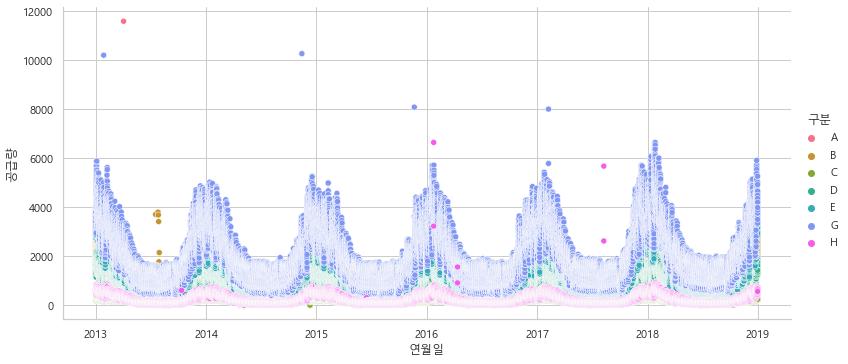

In [4]:
sns.relplot(x='연월일', y='공급량', hue='구분', data=total, aspect=2.2)

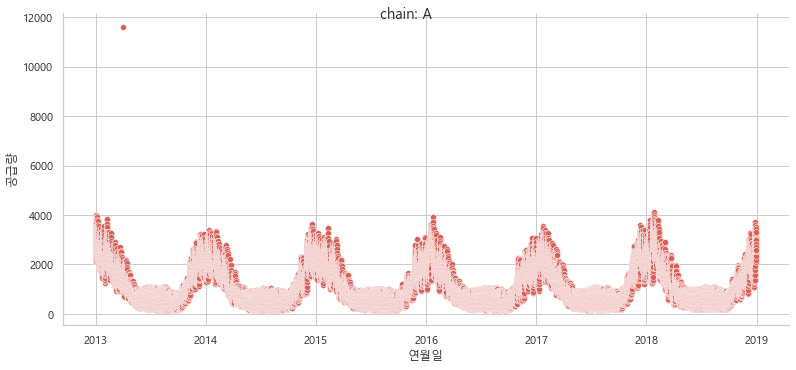

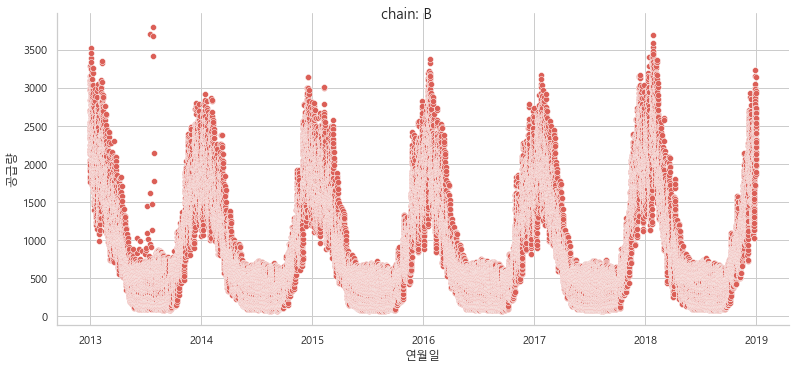

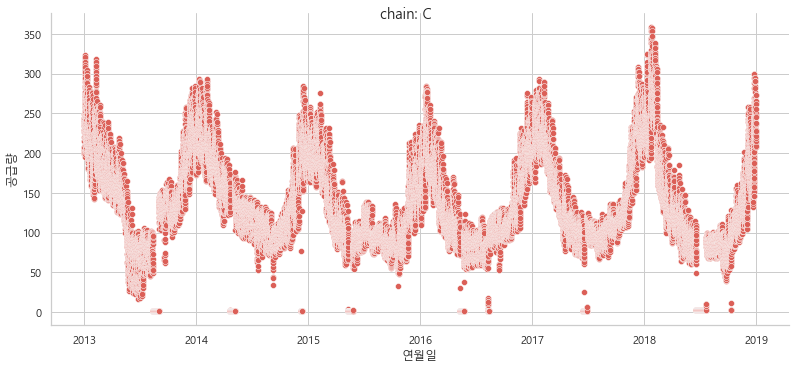

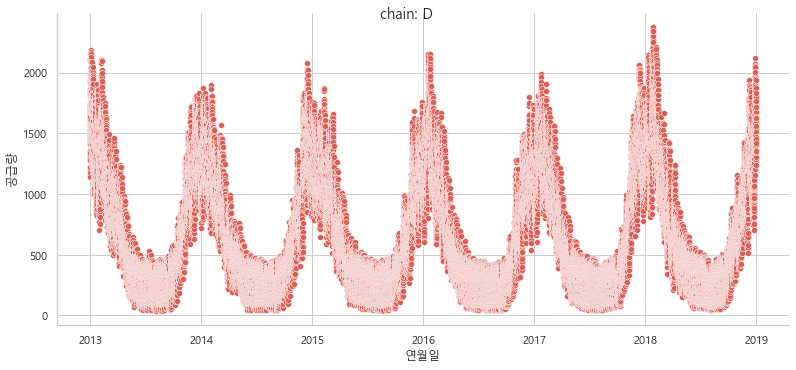

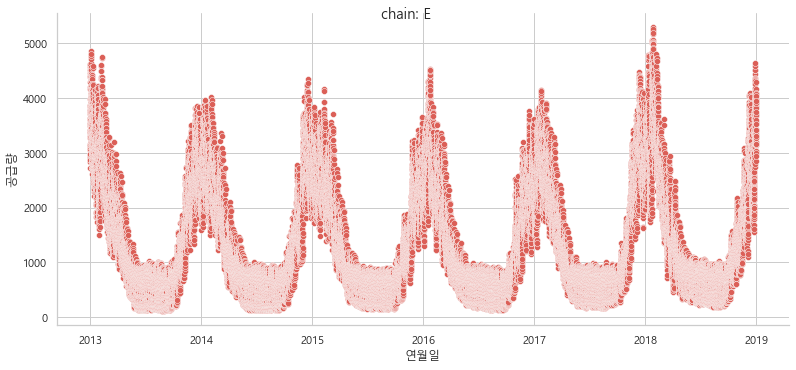

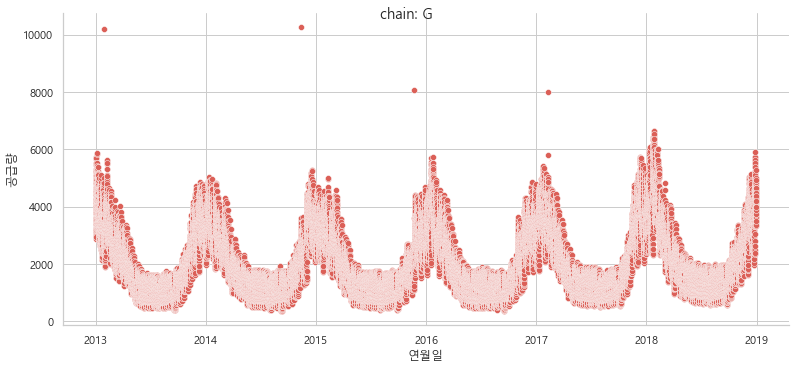

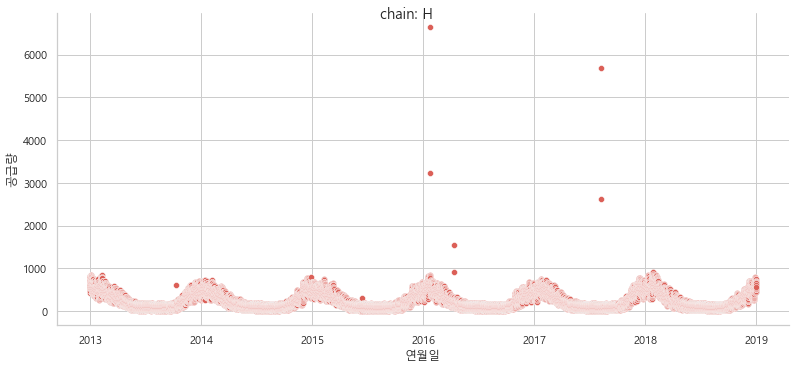

In [5]:
for chain in total['구분'].unique():
    part = total[total['구분']==chain]
    rp = sns.relplot(data=part, x="연월일", y="공급량", aspect=2.2)
    rp.fig.suptitle('chain: '+ chain)

C:\Users\computer\anaconda3\envs\hslee\lib\site-packages\seaborn\axisgrid.py:392: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


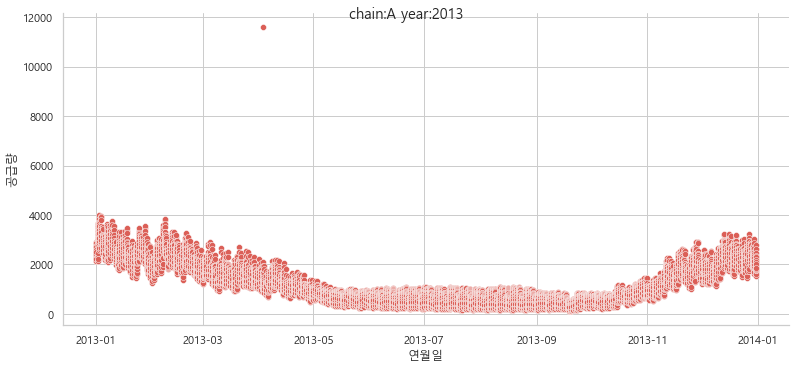

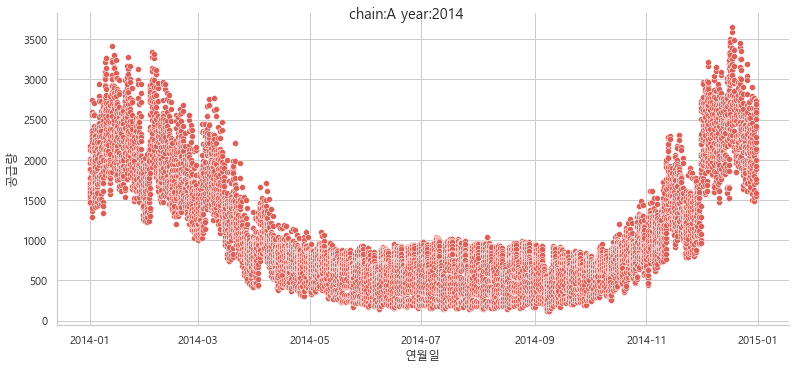

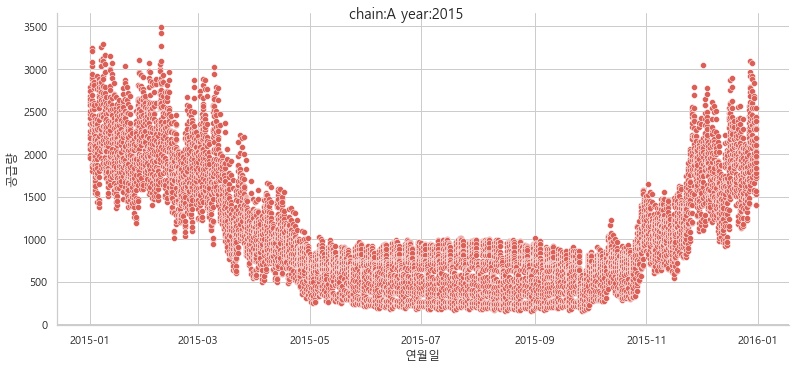

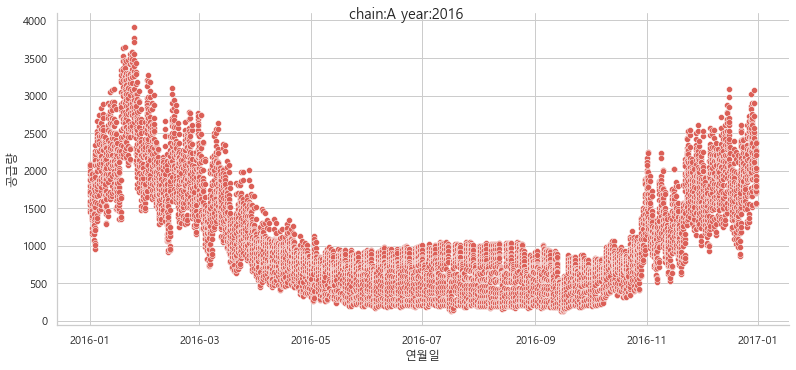

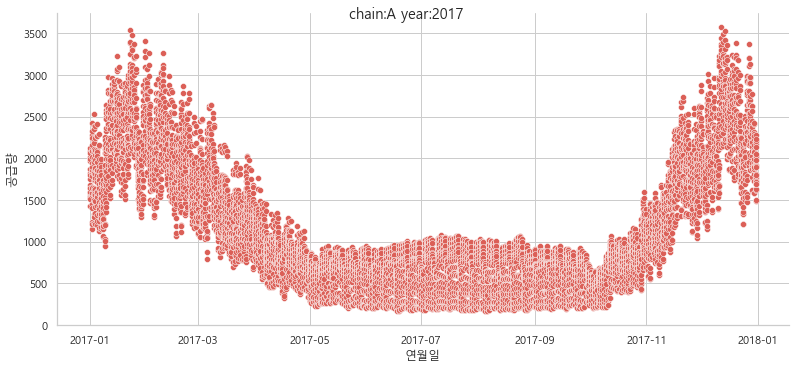

...

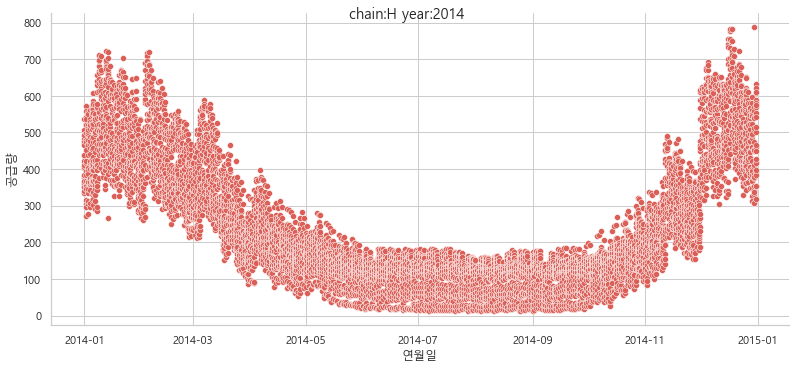

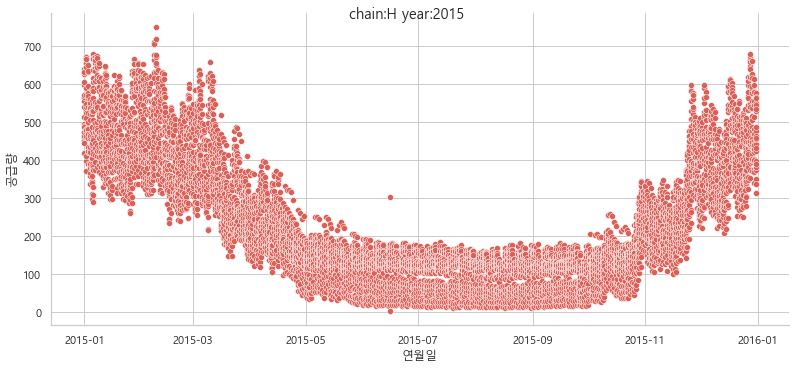

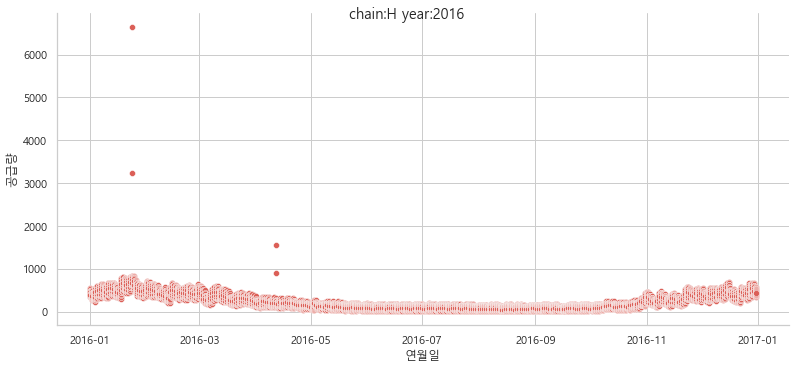

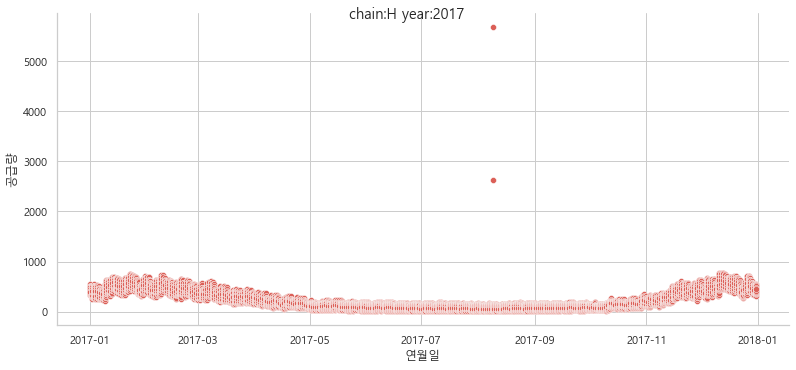

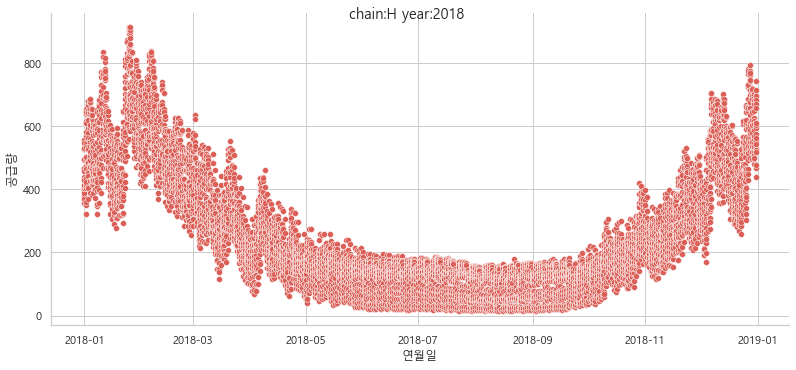

In [6]:
for chain in total['구분'].unique():
    for year in range(2013,2019):
        part = total[(total['구분']==chain)&(total.year==year)]
        rp = sns.relplot(data=part, x="연월일", y="공급량", aspect=2.2)
        rp.fig.suptitle('chain:'+ chain +' year:'+str(year))

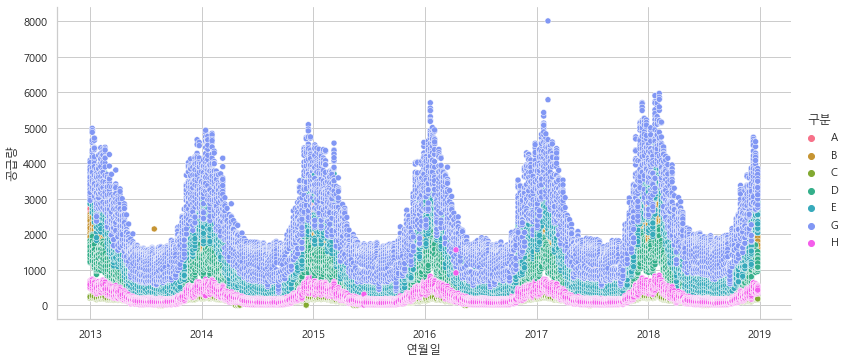

In [7]:
week_df = total[(total['weekday']==1)]
sns.relplot(x='연월일', y='공급량', hue='구분', data=week_df, aspect=2.2)

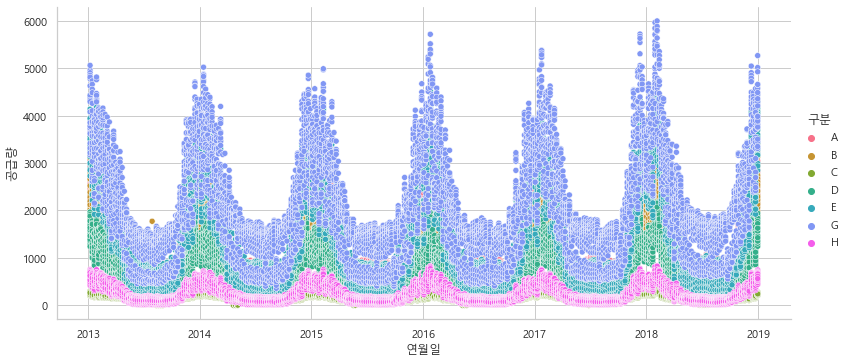

In [8]:
work_df = total[(total['weekday']==0)]
sns.relplot(x='연월일', y='공급량', hue='구분', data=work_df, aspect=2.2)

C:\Users\computer\anaconda3\envs\hslee\lib\site-packages\seaborn\axisgrid.py:392: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


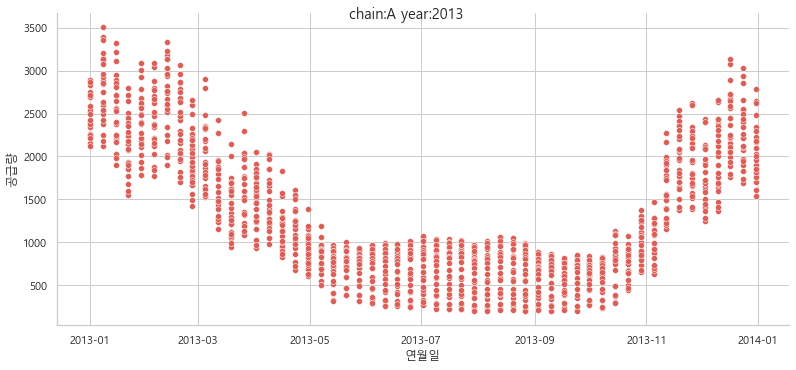

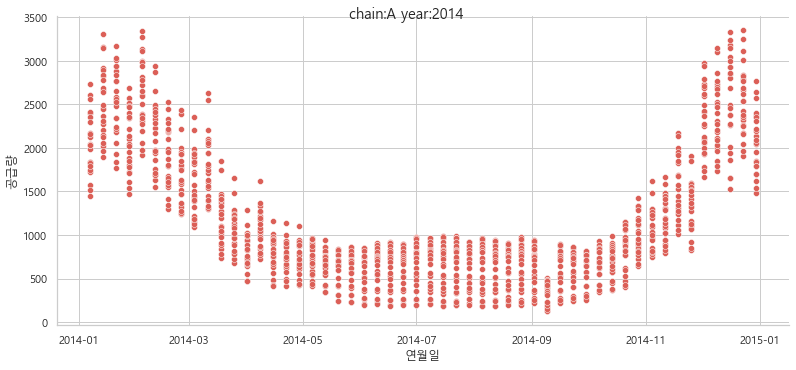

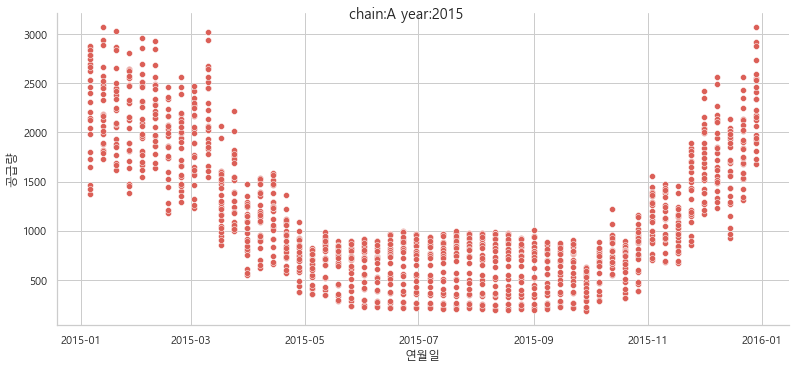

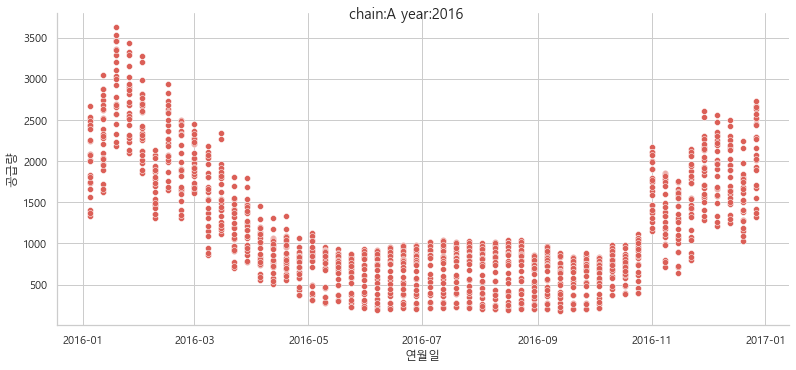

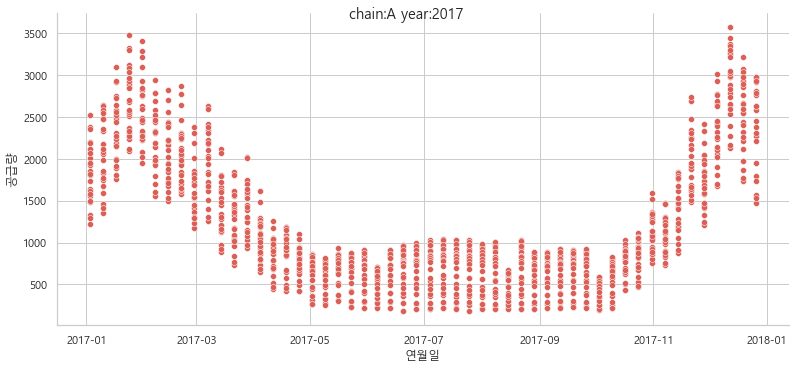

...

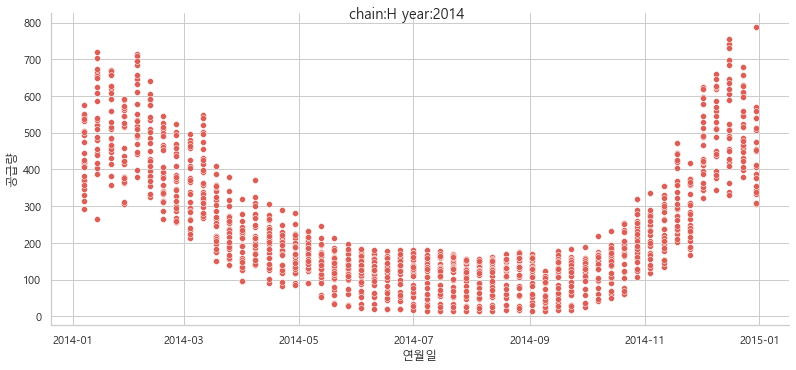

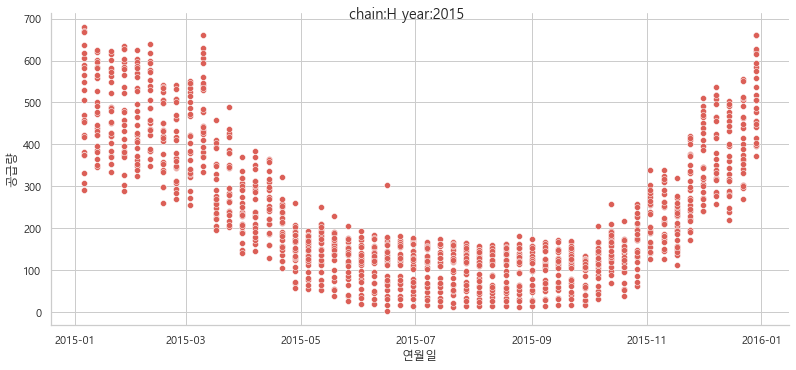

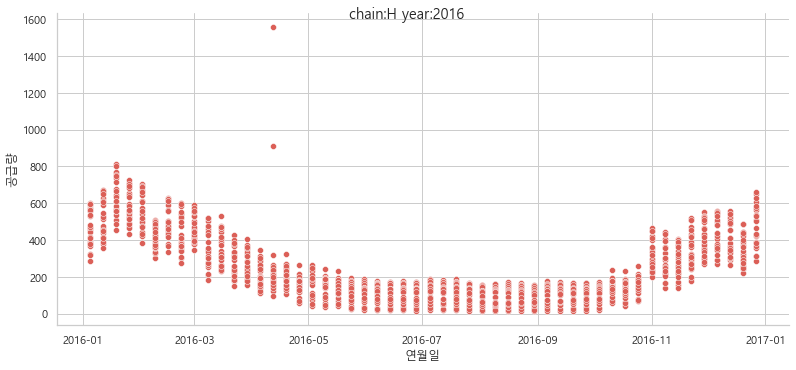

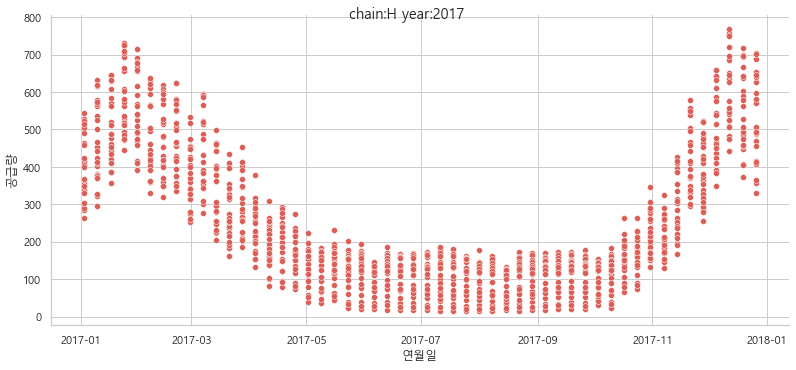

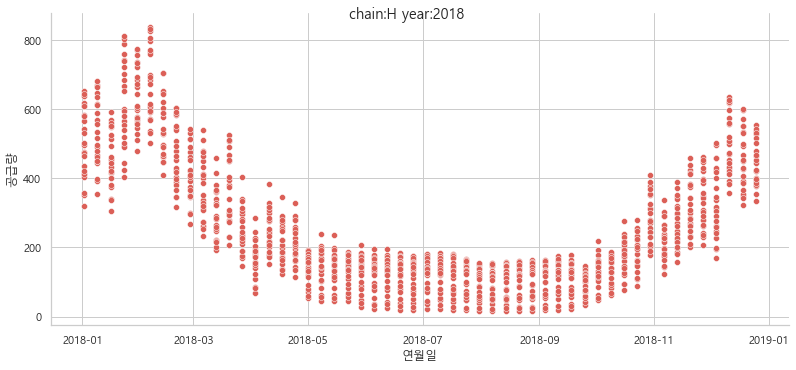

In [9]:
for chain in week_df['구분'].unique():
    for year in range(2013,2019):
        part = week_df[(week_df['구분']==chain)&(week_df.year==year)]
        rp = sns.relplot(data=part, x="연월일", y="공급량", aspect=2.2)
        rp.fig.suptitle('chain:'+ chain +' year:'+str(year))

C:\Users\computer\anaconda3\envs\hslee\lib\site-packages\seaborn\axisgrid.py:392: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axes = plt.subplots(nrow, ncol, **kwargs)


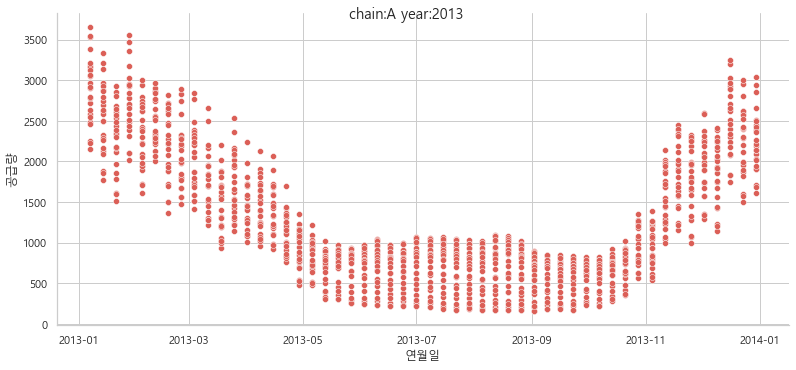

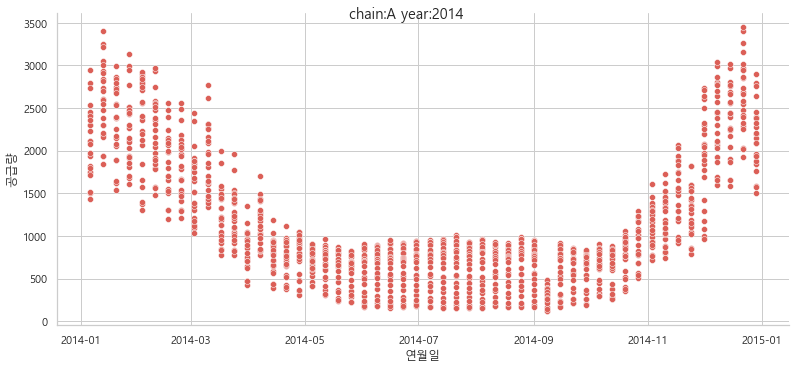

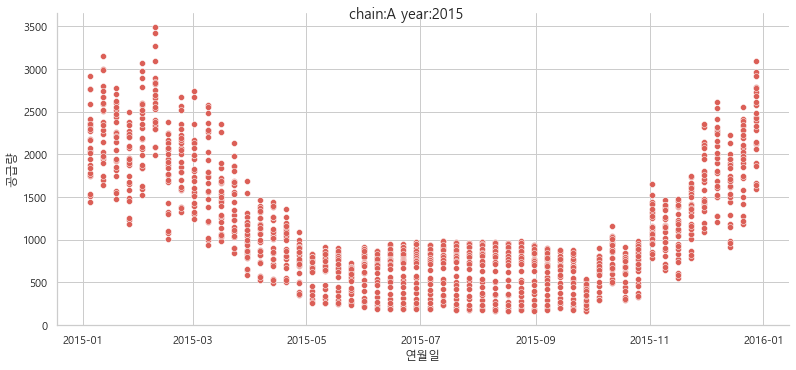

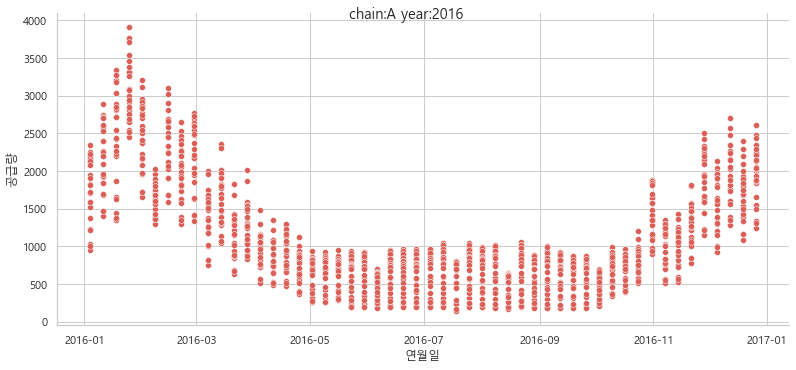

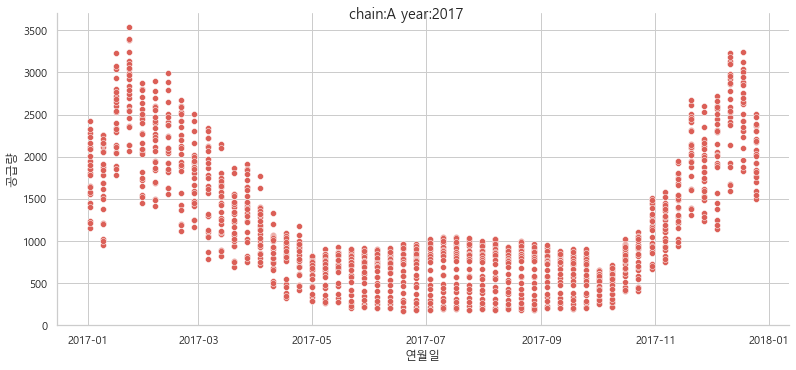

...

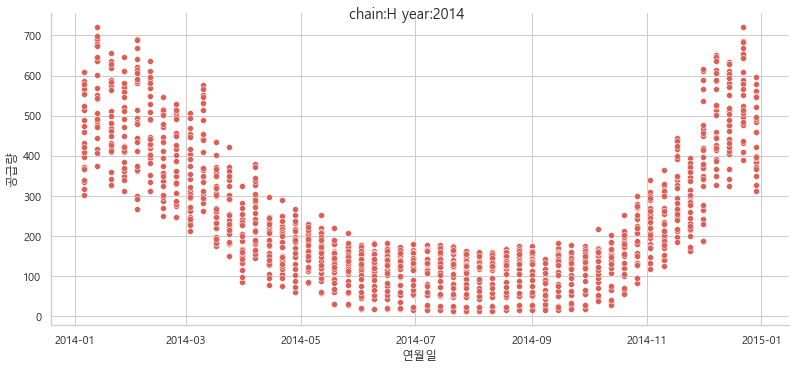

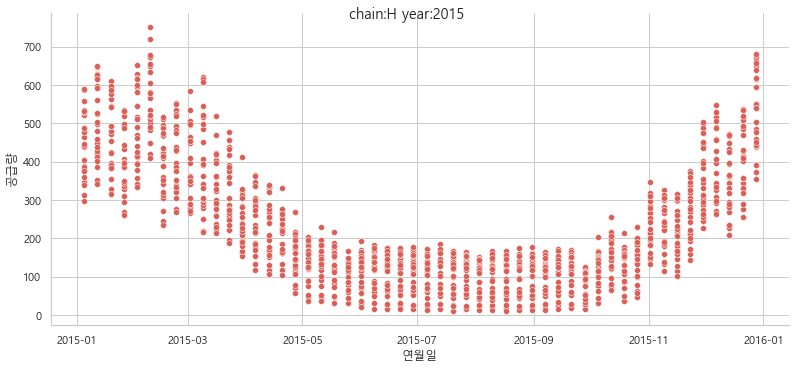

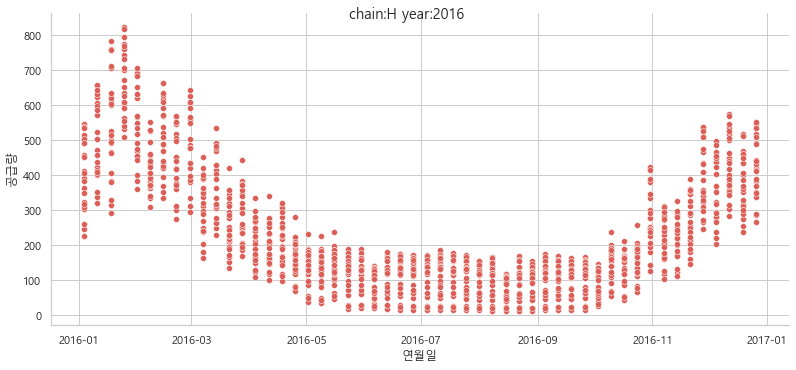

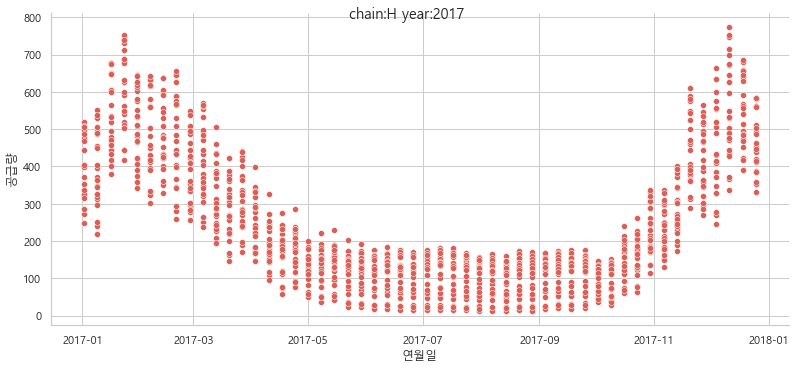

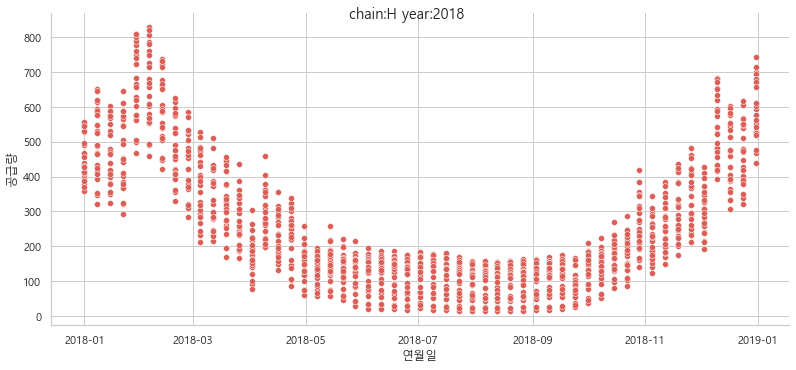

In [10]:
for chain in work_df['구분'].unique():
    for year in range(2013,2019):
        part = work_df[(work_df['구분']==chain)&(work_df.year==year)]
        rp = sns.relplot(data=part, x="연월일", y="공급량", aspect=2.2)
        rp.fig.suptitle('chain:'+ chain +' year:'+str(year))

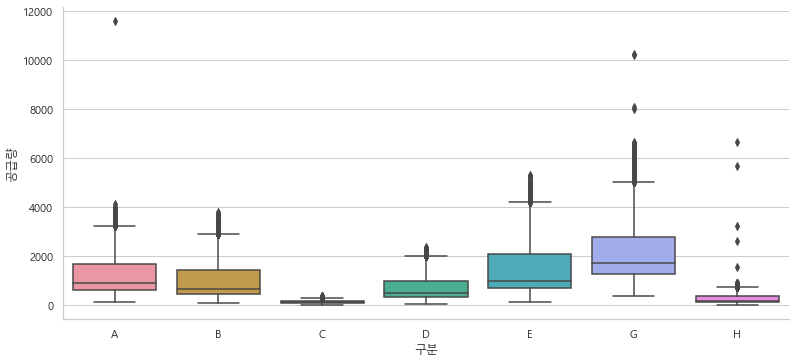

In [13]:
sns.catplot(data=total, x="구분", y="공급량", kind="box", aspect=2.2)

In [17]:
total.columns

Index(['연월일', '시간', '구분', '공급량', 'year', 'month', 'day', 'weekday'], dtype='object')

<AxesSubplot:>

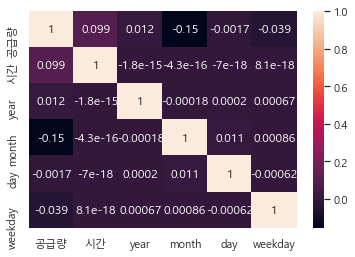

In [18]:
corr_df = total[['공급량', '연월일', '시간', '구분', 'year', 'month', 'day', 'weekday']]
sns.heatmap(corr_df.corr(), annot=True)

In [19]:
train_feature_df = pd.read_csv('./make_data/1_final_train.csv')

C:\Users\computer\anaconda3\envs\hslee\lib\site-packages\matplotlib\backends\backend_agg.py:238: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0.0, flags=flags)
C:\Users\computer\anaconda3\envs\hslee\lib\site-packages\matplotlib\backends\backend_agg.py:201: RuntimeWarning: Glyph 8722 missing from current font.
  font.set_text(s, 0, flags=flags)


<AxesSubplot:>

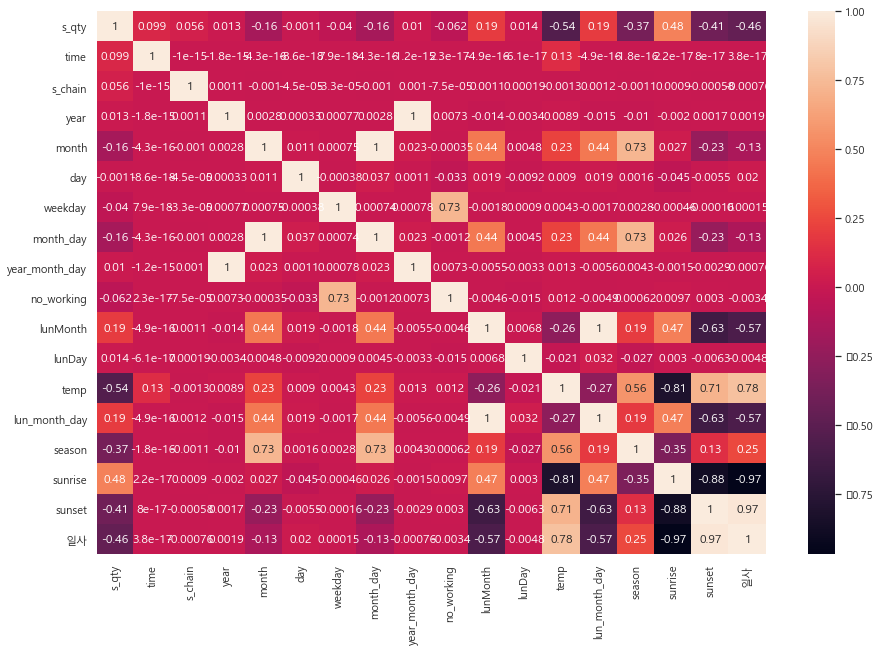

In [27]:
corr_df = train_feature_df[['s_qty', 'date', 'time', 's_chain', 'year', 'month', 'day', 'weekday',
       'month_day', 'year_month_day', 'no_working', 'lunMonth', 'lunDay',
       'temp', 'lun_month_day', 'season', 'sunrise', 'sunset', '일사']]
sns.set(rc = {'figure.figsize':(15,10), 'font.family':'Malgun Gothic'})
sns.heatmap(corr_df.corr(), annot=True)